In [1]:
from anndata import AnnData
import scanpy as sc
import squidpy
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
colors = {"DCT": "#ad116a",
               "IC/DCT": "#820434",
               "Endothelium": "#484d4a", 
               "PC": "#f00028",
               "Immune": "black",
               "Podo": "#6e640e", 
               "Stroma": "#63ad2d",
               "Stroma_2": "#147309",
               "PT": "#0a4082",
               "PT?": "#34a1eb", 
               "iPT/PEC": "#460a82",
               "TAL": "#8c13bf",
               "Injured TAL": "#6b0d75",
               "nan": "tab:gray"
         }

In [3]:
annotation_colors_disc = {"NA":"tab:gray",
                            "nan":"tab:gray",
                            "PT_S1":"#59a0f7",
                            "PT_S2":"#2456c9",
                            "PT_S3":"#0b0785",
                            "iPT":"#1fcff2",
                            "Prolif":"#0c054d",
                            "C_TAL":"#9835de",
                            "M_TAL":"#450175",
                            "DLOH":"#850596",
                            "IC_A":"#f518d4",
                            "IC_B":"#a10e72",
                            "DCT1":"#730233",
                            "PC":"#ad7483",
                            "CNT":"#633340",
                            "DCT/CNT/PC":"#b32230",
                            "DCT2":"#63211c",
                            "Plasma_Cells":"#eb917c",
                            "CD8T":"#cf553a",
                            "CD4T":"#942810",
                            "NK":"#a67a62",
                            "B_Cells":"#f57631",
                            "Mono":"#8f3b0e",
                            "Neutrophil":"#c2823e",
                            "Baso/Mast":"#75420b",
                            "Mac":"#d6a740",
                            "DC":"#7a6433",
                            "Endo_Peritubular":"#000000",
                            "Endo_Lymphatic":"#545454",
                            "Endo_GC":"#2e2e2e",
                            "Fibroblast":"#81f249",
                            "GS_Stromal":"#246603",
                            "Mes":"#0b7d0d",
                            "Podo":"#606326",
                            "PEC":"#387d6c",
                            "Podo/Mes":"#4a6628",
                            "Macula_Densa":"#154f4b",
                            "Neural_Cells":"#5d1e82",
                            "RBC":"#ff0000"}

In [4]:
adata = sc.read_h5ad("/home/levinsj/spatial/adata/postSCVI/7_13_23slide0_PostSCVI_4_30_visium.h5ad")

In [5]:
print(adata)

AnnData object with n_obs × n_vars = 628952 × 798
    obs: 'Ascending_Thin_LOH', 'B_Naive', 'B_intermediate', 'B_memory', 'Baso/Mast', 'CD14_Mono', 'CD16_Mono', 'CD4 CTL', 'CD4T', 'CD8T', 'CNT', 'C_TAL', 'DCT1', 'DCT2', 'DTL', 'Dedifferentiated_Tubule', 'Endo_G', 'Endo_Lym', 'Endo_Peritubular', 'Fibroblast_1', 'Fibroblast_2', 'GS_Stromal', 'IC_A', 'IC_B', 'M_TAL', 'Mac', 'Macula_Densa', 'Mes', 'MyoFib/VSMC', 'NK', 'Neural_Cells', 'Neutrophil', 'PC', 'PEC', 'PT_S1', 'PT_S2', 'PT_S3', 'Plasma_Cells', 'Podo', 'Prolif_Lym', 'RBC', 'cDC', 'iPT', 'pDC', 'leiden', 'region_cluster', 'orig.ident', 'tech', 'nn_33131227.a09b.4d87.addf.d7bb907597e5_1_cluster_cluster_e1ad5c7b.3174.4ee9.bfbc.d6efb6833675_1', 'RNA_nbclust_41a5ffc1.6941.4e83.af9c.d661c9c543e5_1_clusters', 'RNA_nbclust_41a5ffc1.6941.4e83.af9c.d661c9c543e5_1_posterior_probability', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nCount_falsecode', 'nFeature_falsecode', 'fov', 'Area', 'AspectRatio', 'Width', 'Hei

In [6]:
adata.obs["tech"].value_counts()

tech
cosmx     598595
visium     30357
Name: count, dtype: int64

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


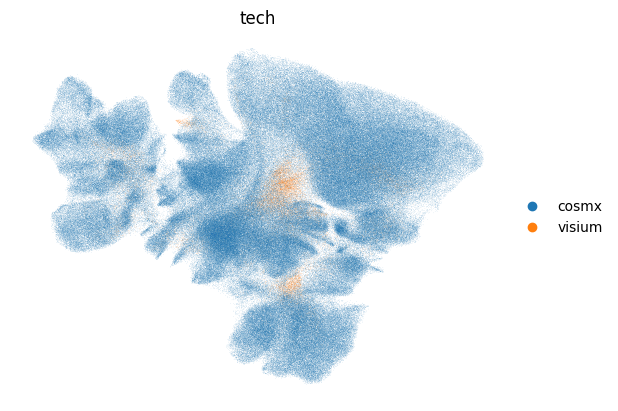

In [7]:
sc.pl.umap(adata, color = "tech",frameon = False)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


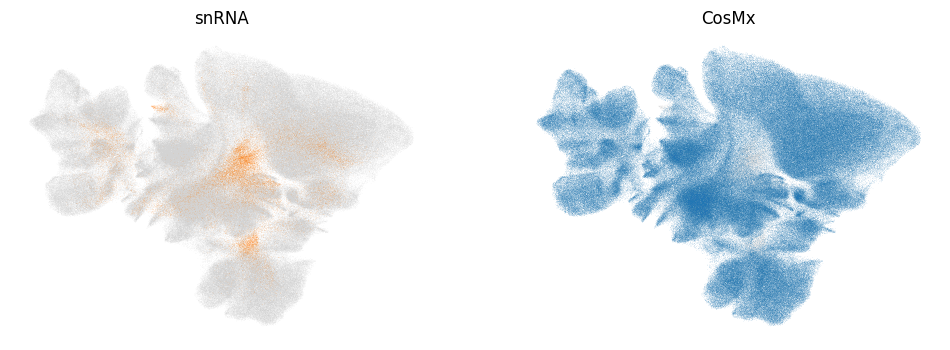

In [8]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
sc.pl.umap(adata, color = "tech", groups = "visium",frameon = False, legend_loc = False, title = "snRNA", show = False, ax = axes[0])
sc.pl.umap(adata, color = "tech", groups = "cosmx",frameon = False, legend_loc = False, title = "CosMx", show = False, ax = axes[1])
plt.axis('off')
plt.show()

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


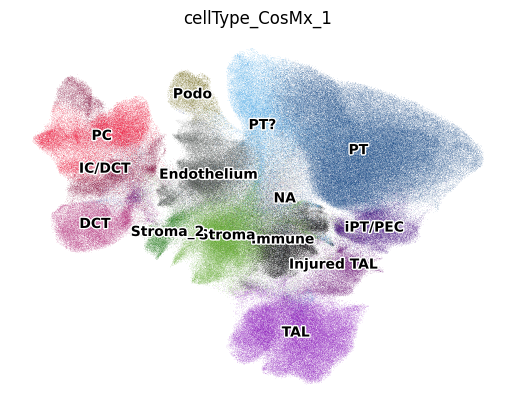

In [9]:
sc.pl.umap(adata, color = "cellType_CosMx_1",palette = colors, frameon = False, legend_loc = 'on data', legend_fontsize=10, legend_fontoutline=2,)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plot

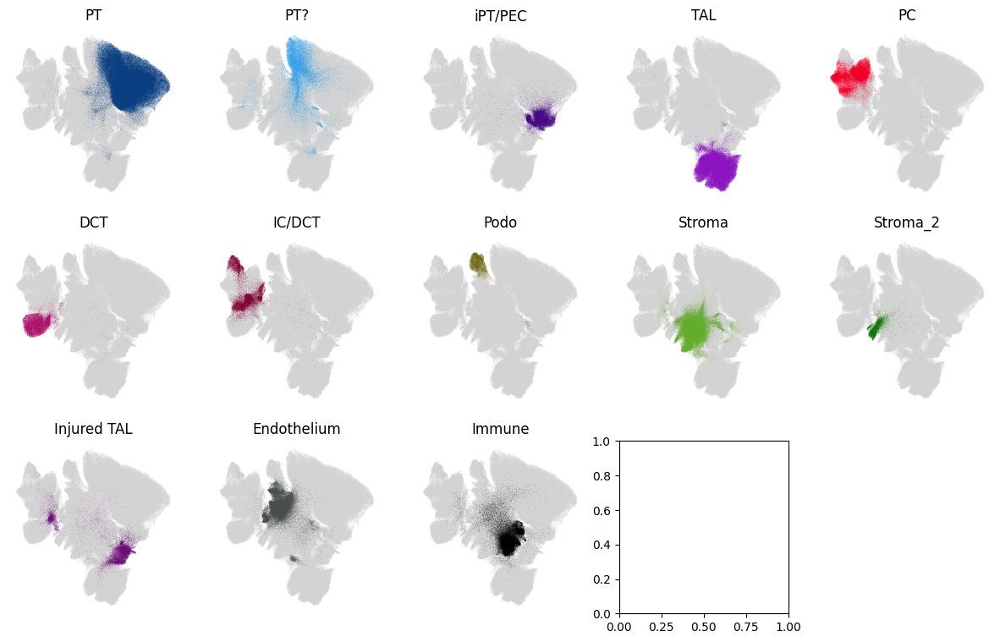

In [10]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 9))

sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "PT",frameon = False, legend_loc = False, title = "PT", show = False, ax = axes[0,0])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "PT?",frameon = False, legend_loc = False, title = "PT?", show = False, ax = axes[0,1])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "iPT/PEC",frameon = False, legend_loc = False, title = "iPT/PEC", show = False, ax = axes[0,2])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "TAL",frameon = False, legend_loc = False, title = "TAL", show = False, ax = axes[0,3])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "PC",frameon = False, legend_loc = False, title = "PC", show = False, ax = axes[0,4])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "DCT",frameon = False, legend_loc = False, title = "DCT", show = False, ax = axes[1,0])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "IC/DCT",frameon = False, legend_loc = False, title = "IC/DCT", show = False, ax = axes[1,1])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "Podo",frameon = False, legend_loc = False, title = "Podo", show = False, ax = axes[1,2])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "Stroma",frameon = False, legend_loc = False, title = "Stroma", show = False, ax = axes[1,3])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "Stroma_2",frameon = False, legend_loc = False, title = "Stroma_2", show = False, ax = axes[1,4])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "Injured TAL",frameon = False, legend_loc = False, title = "Injured TAL", show = False, ax = axes[2,0])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "Endothelium",frameon = False, legend_loc = False, title = "Endothelium", show = False, ax = axes[2,1])
sc.pl.umap(adata, color = "cellType_CosMx_1", groups = "Immune",frameon = False, legend_loc = False, title = "Immune", show = False, ax = axes[2,2])
plt.axis('off')
plt.show()

In [11]:
notAnnotated = ["NA"]
Proxtubule = ["PT_S1","PT_S2","PT_S3","iPT","Dedifferentiated_Tubule"]
LOH = ["C_TAL","M_TAL","Ascending_Thin_LOH",'DTL']
distTubule = ["DCT1","DCT2","CNT","IC_A","IC_B","PC"]
immune = ['B_Naive','B_intermediate', 'B_memory', 'Baso/Mast', 'CD14_Mono', 'CD16_Mono', 'CD4 CTL', 'CD4T', 'CD8T', 'Mac','NK','Neutrophil','pDC','cDC', 'Plasma_Cells']
endo = ['Endo_G', 'Endo_Lym', 'Endo_Peritubular','Prolif_Lym']
stroma = ['Fibroblast_1', 'Fibroblast_2', 'GS_Stromal','Mes','MyoFib/VSMC']
specialized = ["Podo","PEC","Macula_Densa"]
other = ["Neural_Cells",'RBC']

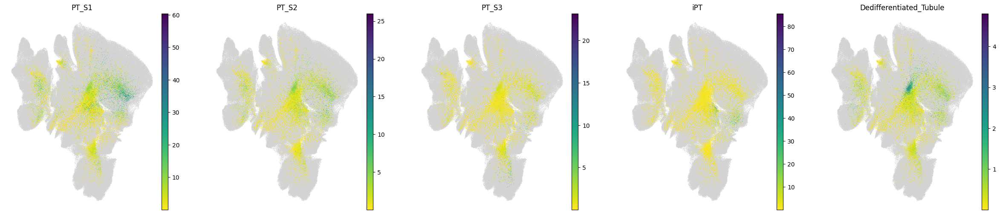

In [12]:
fig, axes = plt.subplots(ncols=len(Proxtubule), figsize=(len(Proxtubule)*6,6))
for j,i in enumerate(Proxtubule):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i,cmap = "viridis_r", show = False, ax = axes[j], size = 1.5)
    
plt.axis('off')
plt.show()

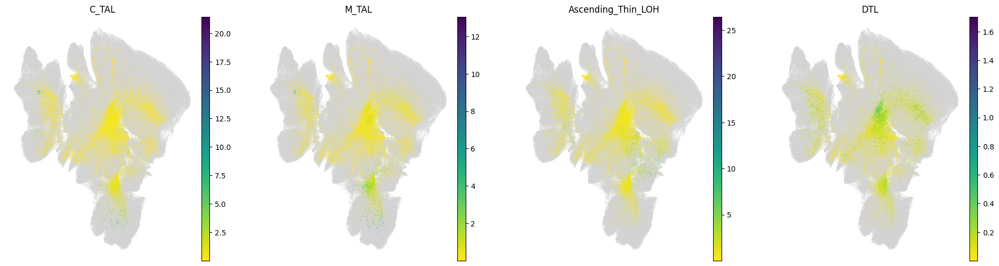

In [13]:
fig, axes = plt.subplots(ncols=len(LOH), figsize=(len(LOH)*6,6))
for j,i in enumerate(LOH):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i, cmap = "viridis_r", show = False, ax = axes[j],size = 1.5)
    
plt.axis('off')
plt.show()

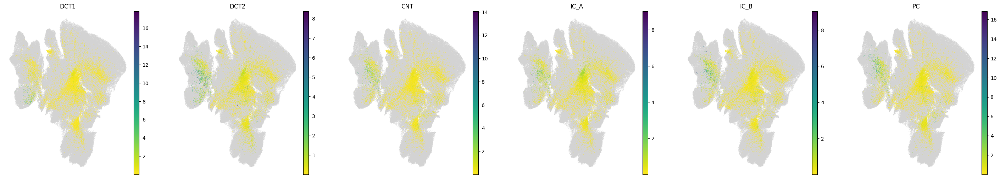

In [14]:
fig, axes = plt.subplots(ncols=len(distTubule), figsize=(len(distTubule)*6,6))
for j,i in enumerate(distTubule):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i, cmap = "viridis_r", show = False, ax = axes[j],size = 1.5)
    
plt.axis('off')
plt.show()

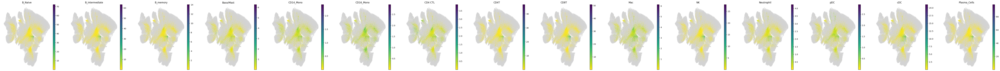

In [15]:
fig, axes = plt.subplots(ncols=len(immune), figsize=(len(immune)*6,6))
for j,i in enumerate(immune):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i, cmap = "viridis_r", show = False, ax = axes[j],size = 1.5)
    
plt.axis('off')
plt.show()

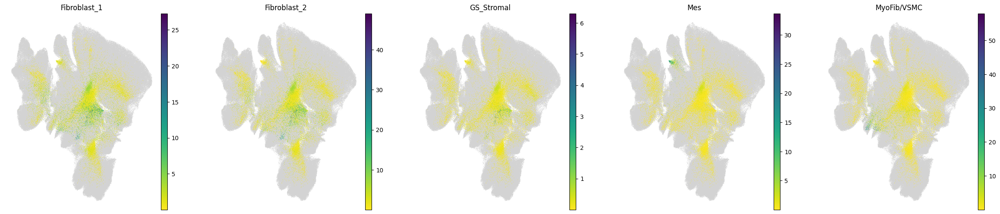

In [16]:
fig, axes = plt.subplots(ncols=len(stroma), figsize=(len(stroma)*6,6))
for j,i in enumerate(stroma):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i, cmap = "viridis_r", show = False, ax = axes[j],size = 1.5)
    
plt.axis('off')
plt.show()

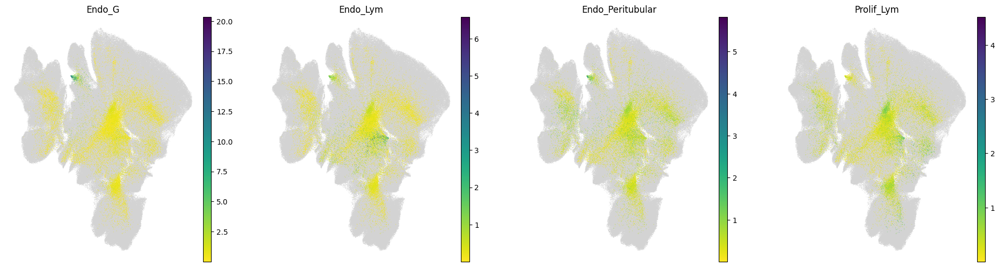

In [17]:
fig, axes = plt.subplots(ncols=len(endo), figsize=(len(endo)*6,6))
for j,i in enumerate(endo):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i, cmap = "viridis_r", show = False, ax = axes[j],size = 1.5)
    
plt.axis('off')
plt.show()

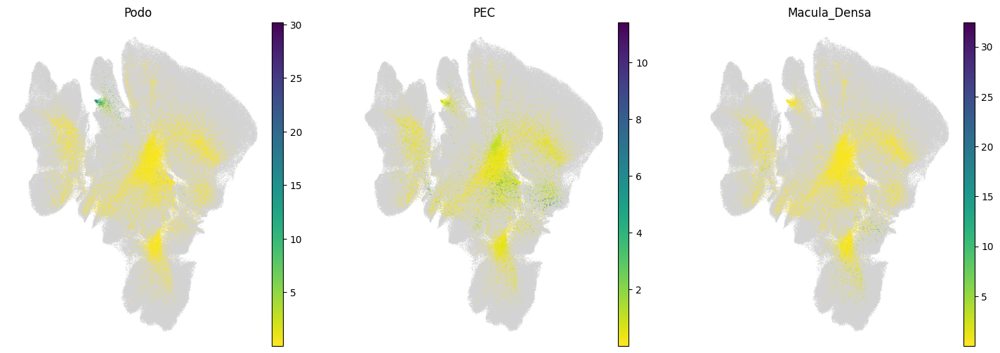

In [18]:
fig, axes = plt.subplots(ncols=len(specialized), figsize=(len(specialized)*6,6))
for j,i in enumerate(specialized):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i, cmap = "viridis_r", show = False, ax = axes[j],size = 1.5)
    
plt.axis('off')
plt.show()

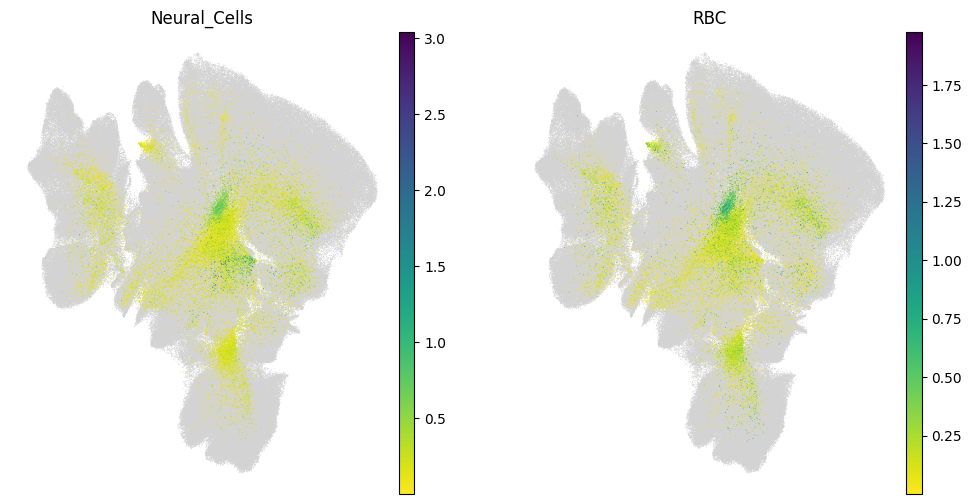

In [19]:
fig, axes = plt.subplots(ncols=len(other), figsize=(len(other)*6,6))
for j,i in enumerate(other):
    sc.pl.umap(adata, color = i,frameon = False, legend_loc = False, title = i, cmap = "viridis_r", show = False, ax = axes[j],size = 1.5)
    
plt.axis('off')
plt.show()